<a href="https://colab.research.google.com/github/ariangh78/Image-Processing/blob/main/QR_CODE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Enhancing QR Code Detection: An Image Processing Research**

# **Introduction**

Quick Response (QR) codes have become ubiquitous in modern society, serving a wide range of applications from simple URLs to complex information encoding. However, the real-world performance of QR code scanning can be hindered by various factors such as image damage, distortion, and angular placement. This research aims to explore and identify image processing techniques that can improve the robustness and accuracy of QR code detection under such challenging conditions.

# **Description**

In this Colab notebook, we investigate the impact of different image processing methods on the ability to detect QR codes. The goal is to determine which techniques are most effective in enhancing QR code readability when faced with various types of damage or non-ideal orientations. The key steps in this research include:


1.   Dataset Preparation: We utilize a comprehensive dataset of QR code images,categorized by types of damage (e.g., scratches, blurs) and angles of capture.

2.   Image Processing Techniques: Various image processing methods are applied to the dataset. These techniques include but are not limited to:
  *   Grayscale Conversion: Converting the image to grayscale to simplify the QR code detection process.
  *   RGB Conversion: Converting the image from BGR (OpenCV default) to RGB for consistent color representation.

  *   Binarization: Converting the grayscale image to binary using a fixed threshold value.

  *   Gaussian Blurring: Applying Gaussian blur to reduce noise and detail.
  Otsu's Thresholding: Automatically determining the best threshold value for binarization using Otsu's method.

  *   Otsu's Thresholding with Gaussian Blur: Combining Gaussian blurring with Otsu's thresholding for improved binarization results.


# Requirements

In [ ]:
!pip install pyzbar

In [ ]:
!apt-get install libzbar0

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gsfonts imagemagick-6-common
  libdjvulibre-text libdjvulibre21 libfftw3-double3 libgs9 libgs9-common libidn12 libijs-0.35
  libjbig2dec0 libjxr-tools libjxr0 liblqr-1-0 libmagickcore-6.q16-6 libmagickcore-6.q16-6-extra
  libmagickwand-6.q16-6 libv4l-0 libv4lconvert0 libwmflite-0.2-7 poppler-data
Suggested packages:
  fonts-noto fonts-freefont-otf | fonts-freefont-ttf fonts-texgyre ghostscript-x libfftw3-bin
  libfftw3-dev inkscape poppler-utils fonts-japanese-mincho | fonts-ipafont-mincho
  fonts-japanese-gothic | fonts-ipafont-gothic fonts-arphic-ukai fonts-arphic-uming fonts-nanum
The following NEW packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gsfonts imagemagick-6-common
  libdjvulibre-text libdjvulibre21 libfftw3-doub

In [ ]:
!apk add zbar

/bin/bash: line 1: apk: command not found


In [ ]:
import cv2
from pyzbar.pyzbar import decode
from google.colab.patches import cv2_imshow
import pyzbar
import os
import os
import cv2
from pyzbar.pyzbar import decode
print(pyzbar.__version__)


# Load DataSet

In [ ]:
!git clone https://github.com/tony-xlh/barcode-dataset.git

Cloning into 'barcode-dataset'...
remote: Enumerating objects: 1653, done.
remote: Counting objects: 100% (100/100), done.
remote: Compressing objects: 100% (98/98), done.
remote: Total 1653 (delta 20), reused 78 (delta 2), pack-reused 1553
Receiving objects: 100% (1653/1653), 430.83 MiB | 25.77 MiB/s, done.
Resolving deltas: 100% (372/372), done.
Updating files: 100% (1062/1062), done.


# **Processing Each Folder and Image**

In [ ]:
main_folder_path = "/content/barcode-dataset/benchmark/dataset/QRCode"
count = 0
suc = 0
fail = 0
suc_addresses = {}
fail_addresses = {}
folderBase = {}

# Iterate through each folder in the main folder
for folder_name in os.listdir(main_folder_path):
    folder_path = os.path.join(main_folder_path, folder_name)
    folder_image_paths = []  # List to store image paths in the current folder
    failAdd=[]
    successAdd=[]
    # Check if the item in the main folder is a folder
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder_name}")
        # Iterate through each image file in the current folder
        for image_name in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_name)

            # Check if the item is a file and ends with an image extension
            if os.path.isfile(image_path) and any(image_name.lower().endswith(ext) for ext in ['.jpg', '.jpeg', '.png']):
                print(f"Processing image: {image_name}")
                count += 1
                # Read the image using OpenCV
                image = cv2.imread(image_path)
                # Decode QR code from the image using Pyzbar
                decoded_objects = decode(image)

                if len(decoded_objects) == 0:
                    fail += 1
                    failAdd.append(image_path)
                else:
                    suc += 1
                    successAdd.append(image_path)

                # Store the image path in the current folder's list
                folder_image_paths.append(image_path)
            else:
                print(f"Ignoring non-image file: {image_name}")

    else:
        print(f"Ignoring non-folder item: {folder_name}")

    # Store the list of image paths in the dictionary with folder name as key
    fail_addresses[folder_name]=failAdd
    folderBase[folder_name] = folder_image_paths

print("Total images processed:", count)
print("Successful detections:", suc)
print("Failed detections:", fail)

Processing folder: shadows
Processing image: image004.jpg
Processing image: image003.jpg
Processing image: image013.jpg
Processing image: image002.jpg
Processing image: image001.jpg
Processing image: image005.jpg
Processing image: image008.jpg
Processing image: image009.jpg
Processing image: image006.jpg
Processing image: image007.jpg
Processing image: image014.jpg
Processing image: image012.jpg
Processing image: image011.jpg
Processing image: image010.jpg
Processing folder: glare
Processing image: image022.jpg
Processing image: image023.jpg
Processing image: image039.jpg
Processing image: image025.jpg
Processing image: image028.jpg
Processing image: image045.jpg
Processing image: image021.jpg
Processing image: image020.jpg
Processing image: image004.jpg
Processing image: image040.jpg
Processing image: image003.jpg
Processing image: image013.jpg
Processing image: image002.jpg
Processing image: image001.jpg
Processing image: image035.jpg
Processing image: image005.jpg
Processing image: 

In [ ]:
folder_fail_count_occurrences = {}
# Iterate through each key-value pair in fail_addresses
for folder_name, image_paths in fail_addresses.items():
    # Calculate the count of items in the list (number of image paths)
    count = len(image_paths)
    # Store the count for the current key (folder name)
    folder_fail_count_occurrences[folder_name] = count
# Print the count of items for each key
for folder_name, count in folder_fail_count_occurrences.items():
    print(f"Folder '{folder_name}' has {count} occurrences of failed detections.")

Folder 'shadows' has 3 occurrences of failed detections.
Folder 'close' has 35 occurrences of failed detections.
Folder 'blurred' has 24 occurrences of failed detections.
Folder 'detection_result_filenames.json' has 0 occurrences of failed detections.
Folder 'curved' has 30 occurrences of failed detections.
Folder 'pathological' has 8 occurrences of failed detections.
Folder 'high_version' has 26 occurrences of failed detections.
Folder 'rotations' has 17 occurrences of failed detections.
Folder 'noncompliant' has 14 occurrences of failed detections.
Folder 'monitor' has 17 occurrences of failed detections.
Folder 'nominal' has 19 occurrences of failed detections.
Folder 'lots' has 0 occurrences of failed detections.
Folder 'results.zip' has 0 occurrences of failed detections.
Folder 'glare' has 31 occurrences of failed detections.
Folder 'project_manifest.json' has 0 occurrences of failed detections.
Folder 'perspective' has 19 occurrences of failed detections.
Folder 'damaged' has 29

In [ ]:
folder_fail_count_occurrences

{'shadows': 3,
 'close': 35,
 'blurred': 24,
 'detection_result_filenames.json': 0,
 'curved': 30,
 'pathological': 8,
 'high_version': 26,
 'rotations': 17,
 'noncompliant': 14,
 'monitor': 17,
 'nominal': 19,
 'lots': 0,
 'results.zip': 0,
 'glare': 31,
 'project_manifest.json': 0,
 'perspective': 19,
 'damaged': 29,
 'bright_spots': 21,
 'brightness': 9}

In [ ]:
folderBase

{'shadows': ['/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image014.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image001.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image013.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image008.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image012.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image005.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image010.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image003.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image011.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image007.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image006.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image009.jpg',
  '/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image004.jpg',
 

In [ ]:
print(fail)

302


In [ ]:
print(suc)

234


In [ ]:
import numpy as np


In [ ]:
concatenated_array = np.concatenate((suc_addresses, fail_addresses), axis=0)

In [ ]:
concatenated_array

array(['/content/barcode-dataset/benchmark/dataset/QRCode/lots/image001.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/lots/image006.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/lots/image005.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/lots/image003.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/lots/image002.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/lots/image004.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/lots/image007.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/brightness/image018.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/brightness/image001.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/brightness/image025.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/brightness/image014.jpg',
       '/content/barcode-dataset/benchmark/dataset/QRCode/brightness/image024.jpg',
       '/content/barcode-dataset/b

In [ ]:
Acc = suc/536 * 100

In [ ]:
Acc

43.656716417910445

In [ ]:
import random

array_sample = random.sample(sorted(folderBase.values()), 1)[0][3]


In [ ]:
array_sample

'/content/barcode-dataset/benchmark/dataset/QRCode/shadows/image008.jpg'

[Decoded(data=b'HTTPS://NUTS.COM/QR/retail_piece/51707477?sku=7030-01', type='QRCODE', rect=Rect(left=916, top=2386, width=256, height=265), polygon=[Point(x=916, y=2634), Point(x=1157, y=2651), Point(x=1172, y=2399), Point(x=933, y=2386)], quality=1, orientation='UP')]
Type: QRCODE
Data: HTTPS://NUTS.COM/QR/retail_piece/51707477?sku=7030-01


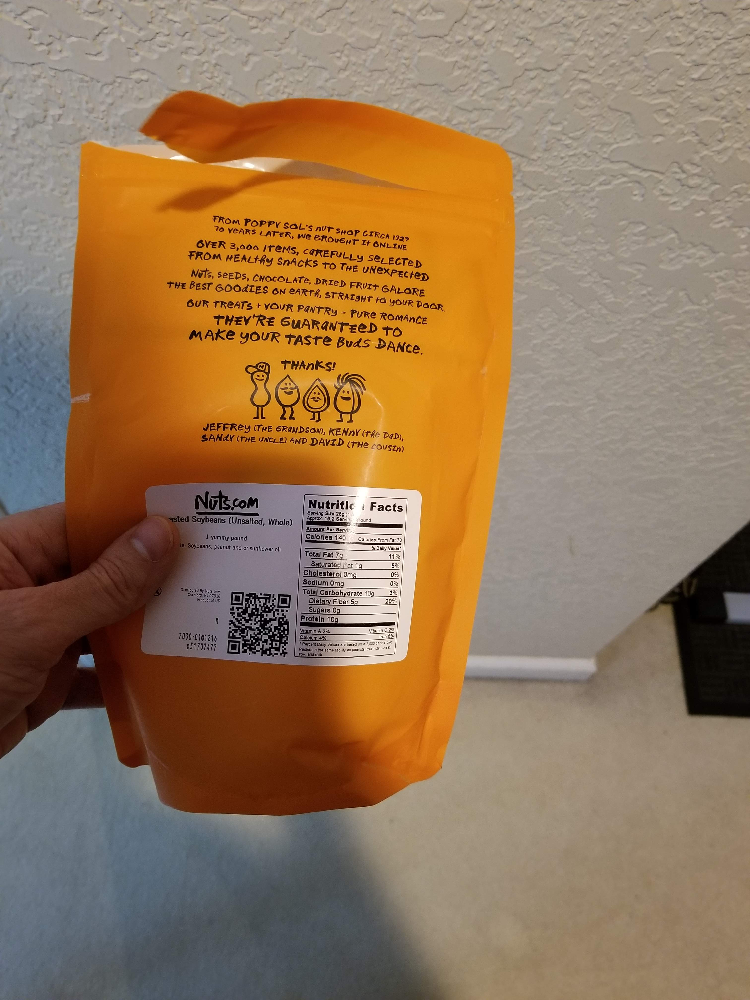

In [ ]:

# Read the input image
image = cv2.imread(array_sample)

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


decoded_objects = decode(image)
print(decoded_objects)
# Display the decoded information
for obj in decoded_objects:
    print('Type:', obj.type)
    print('Data:', obj.data.decode('utf-8'))

# Display the image with QR code detection results (optional)
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

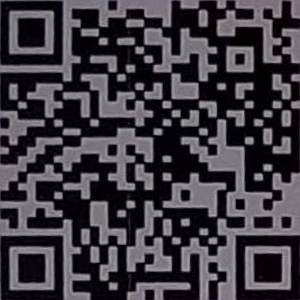

In [ ]:
import cv2
import numpy as np

def perspective_transformation(image, qr_code_corners):
    # Define the destination points for the perspective transformation
    width, height = 300, 300  # Set the dimensions of the output image
    dst_points = np.array([[0, 0], [width - 1, 0], [width - 1, height - 1], [0, height - 1]], dtype=np.float32)
    # Convert the QR code corners to a numpy array
    src_points = np.array(qr_code_corners, dtype=np.float32)

    # Perform the perspective transformation
    matrix = cv2.getPerspectiveTransform(src_points, dst_points)
    transformed_image = cv2.warpPerspective(image, matrix, (width, height))

    return transformed_image
image = cv2.imread(array_sample)
decoded_objects = decode(image)
qr_code_corners = decoded_objects[0].polygon  # Extract corner points
qr_code_corners = [[point.x, point.y] for point in qr_code_corners]  # Convert to list of (x, y) tuples

# Perform perspective transformation
transformed_image = perspective_transformation(image, qr_code_corners)

    # Display the original and transformed images
cv2_imshow(transformed_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
def preprocess2(address):
    FailedROI=0
    processed_images = []
    for folder_name, image_paths in address.items():
        for image_path in image_paths:
            image = cv2.imread(image_path)
            original = image.copy()
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            blur = cv2.GaussianBlur(gray, (9,9), 0)
            thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
            kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
            close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
            cnts = cv2.findContours(close, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cnts = cnts[0] if len(cnts) == 2 else cnts[1]
            for c in cnts:
                peri = cv2.arcLength(c, True)
                approx = cv2.approxPolyDP(c, 0.04 * peri, True)
                x,y,w,h = cv2.boundingRect(approx)
                area = cv2.contourArea(c)
                ar = w / float(h)
                if len(approx) == 4 and area > 1000 and (ar > .85 and ar < 1.3):
                    cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 3)
                    ROI = original[y:y+h, x:x+w]
                    cv2.imwrite('ROI.png', ROI)
                    decoded_objects = decode(ROI)
                    if len(decoded_objects) == 0:
                        FailedROI=FailedROI+1

    return processed_images , FailedROI

In [ ]:
p,FailedROI=preprocess2(fail_addresses)

In [ ]:
FailedROI

1006

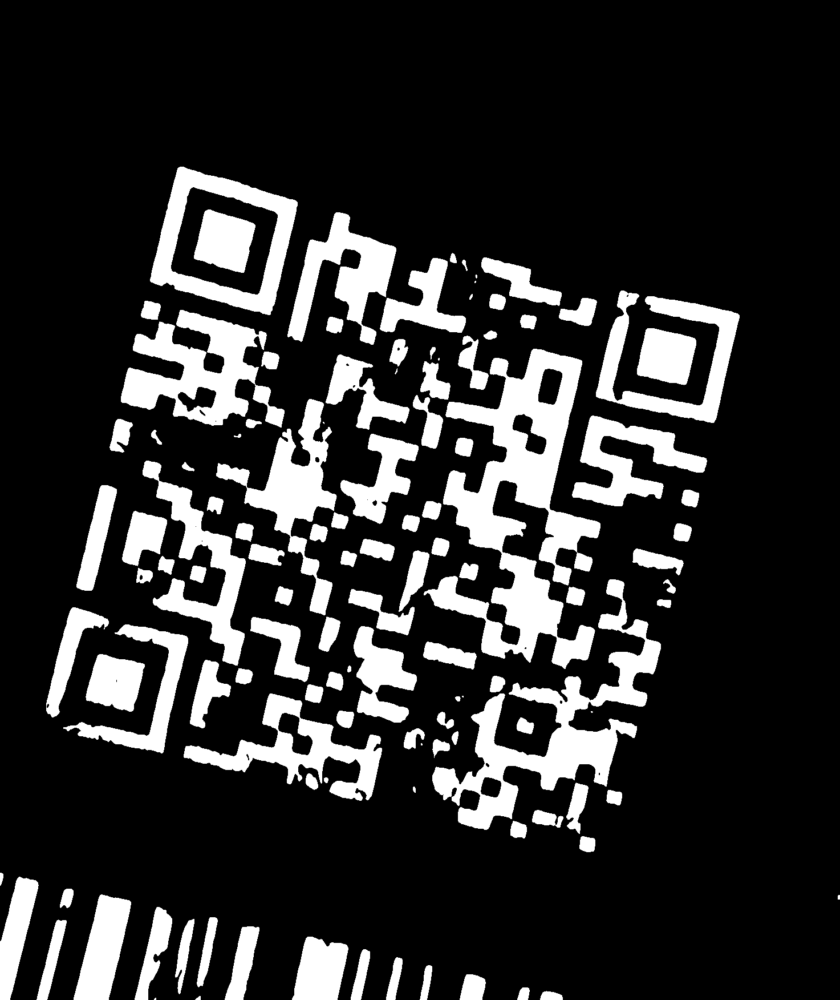

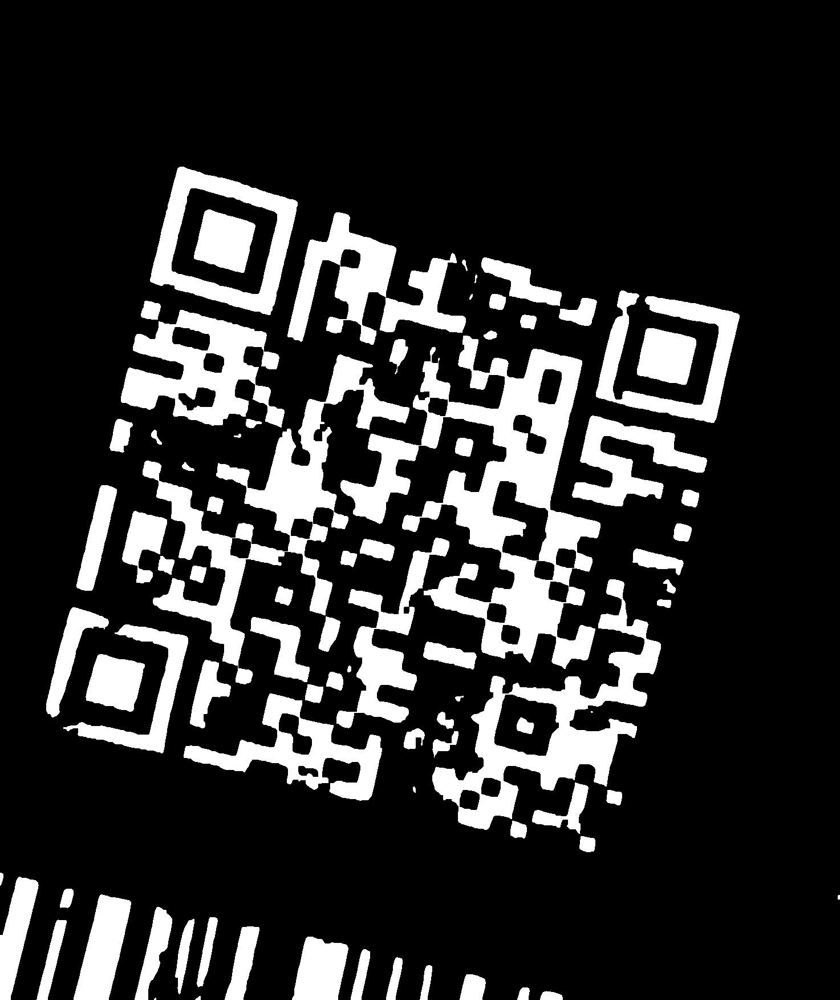

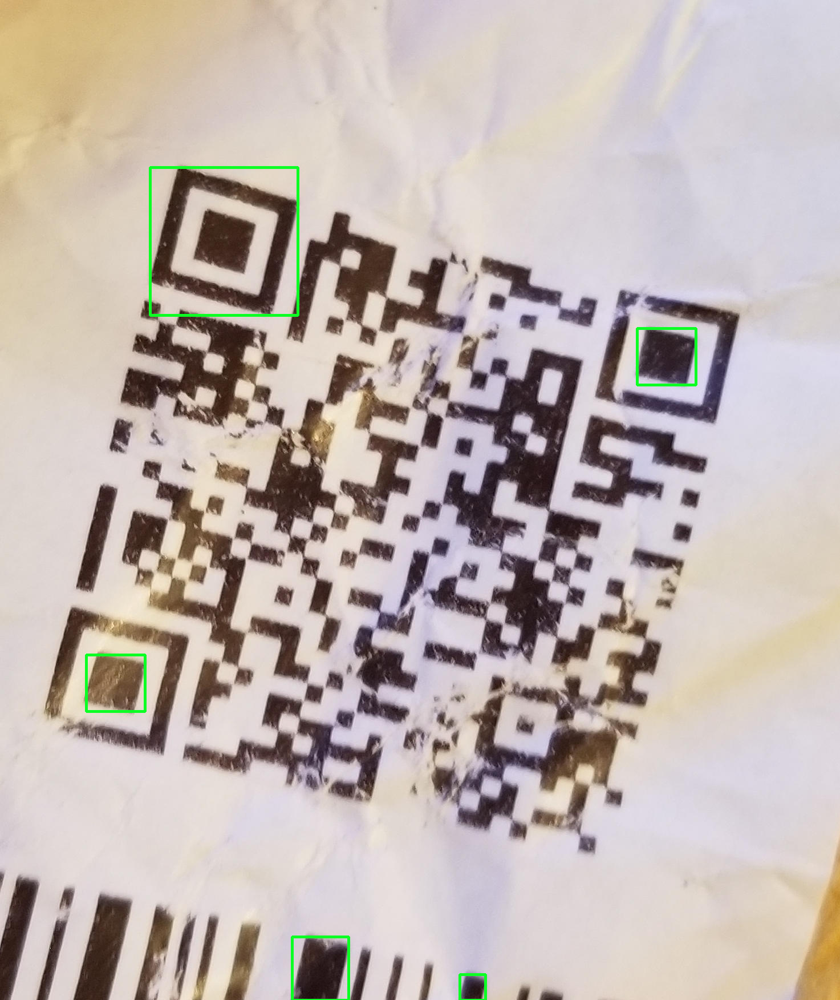

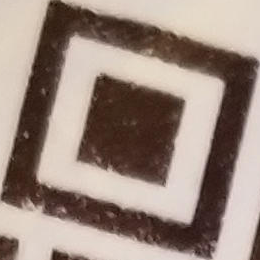

-1

In [ ]:
import cv2
import numpy as np

# Load imgae, grayscale, Gaussian blur, Otsu's threshold

original = image.copy()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (9,9), 0)
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Morph close
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

# Find contours and filter for QR code
cnts = cv2.findContours(close, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.04 * peri, True)
    x,y,w,h = cv2.boundingRect(approx)
    area = cv2.contourArea(c)
    ar = w / float(h)
    if len(approx) == 4 and area > 1000 and (ar > .85 and ar < 1.3):
        cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 3)
        ROI = original[y:y+h+1, x:x+w+1]
        cv2.imwrite('ROI.png', ROI)

cv2_imshow( thresh)
cv2_imshow( close)
cv2_imshow(image)
cv2_imshow(ROI)
cv2.waitKey()

In [ ]:
qr_code_corners


[[32, 32], [32, 265], [265, 265], [265, 32]]

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def grayscale_conversion(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray_image

def rgb_conversion(image):
    # Convert BGR image to RGB
    rgb_image = image[:, :, ::-1]
    return rgb_image

def binarization(image, threshold_value=128):
    # Convert grayscale image to binary using thresholding
    _, binary_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)
    return binary_image

def gaussian_blur(image, kernel_size=(5, 5)):
    # Apply Gaussian blur
    blurred_image = cv2.GaussianBlur(image, kernel_size, 0)
    return blurred_image

def otsu_threshold(image):
    # Apply Otsu's thresholding
    _, otsu_threshold_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    return otsu_threshold_image

def otsu_blurred(image):
    # Convert the input image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur
    blurred_image = gaussian_blur(gray_image,kernel_size=(3, 3))

    # Apply Otsu's thresholding
    ot_bl = otsu_threshold(blurred_image)

    return ot_bl


In [ ]:
cv2.THRESH_BINARY+cv2.THRESH_OTSU

8

In [ ]:
def convolution(image, kernel):
    # Apply convolution operation between image and kernel
    kernel_height, kernel_width = kernel.shape
    image_height, image_width = image.shape

    output = np.zeros_like(image)

    # Pad the image with zeros to handle borders
    padded_image = np.pad(image, ((kernel_height//2, kernel_height//2), (kernel_width//2, kernel_width//2)), mode='constant')

    # Perform convolution
    for y in range(image_height):
        for x in range(image_width):
            output[y, x] = np.sum(padded_image[y:y+kernel_height, x:x+kernel_width] * kernel)

    return output

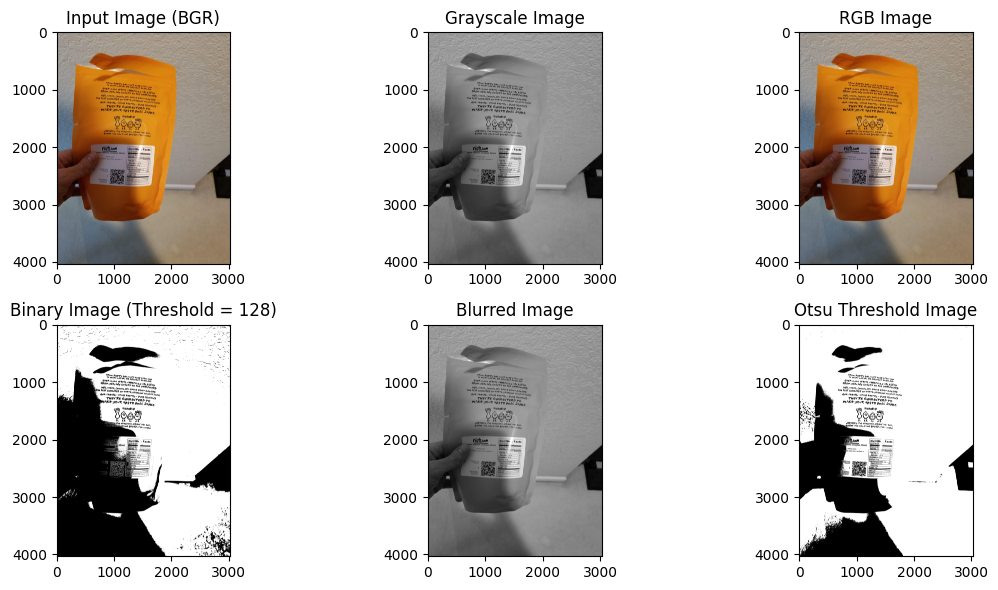

In [ ]:
# Example usage:
input_image = cv2.imread(array_sample)

grayscale_image = grayscale_conversion(input_image)
rgb_image = rgb_conversion(input_image)
binary_image = binarization(grayscale_image)
blurred_image = gaussian_blur(grayscale_image)
otsu_image = otsu_threshold(grayscale_image)

# Displaying the images
plt.figure(figsize=(12, 6))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
plt.title('Input Image (BGR)')

plt.subplot(2, 3, 2)
plt.imshow(grayscale_image, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(2, 3, 3)
plt.imshow(rgb_image)
plt.title('RGB Image')

plt.subplot(2, 3, 4)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image (Threshold = 128)')

plt.subplot(2, 3, 5)
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image')

plt.subplot(2, 3, 6)
plt.imshow(otsu_image, cmap='gray')
plt.title('Otsu Threshold Image')

plt.tight_layout()
plt.show()

In [ ]:
def binarization2(image, threshold_value=128):
    # Convert grayscale image to binary based on a threshold value
    binary_image = np.where(image > threshold_value, 255, 0).astype(np.uint8)
    return binary_image


def gaussian_blur2(image, kernel_size=(5, 5)):
    # Apply Gaussian blur by convolving the image with a Gaussian kernel
    kernel = gaussian_kernel(kernel_size)
    blurred_image = convolution(image, kernel)
    return blurred_image


def otsu_threshold2(image):
    # Compute Otsu's threshold value and binarize the image
    threshold_value = otsu_threshold_value(image)
    binary_image = binarization(image, threshold_value)
    return binary_image


# Helper functions for Gaussian blur and Otsu's thresholding

def gaussian_kernel(kernel_size, sigma=1):
    # Create a Gaussian kernel
    kernel = np.fromfunction(lambda x, y: (1/(2*np.pi*sigma**2)) * np.exp(-((x-(kernel_size[0]-1)/2)**2 + (y-(kernel_size[1]-1)/2)**2)/(2*sigma**2)), kernel_size)
    kernel /= np.sum(kernel)
    return kernel


def otsu_threshold_value(image):
    # Compute Otsu's threshold value
    hist, _ = np.histogram(image.flatten(), bins=np.arange(256))
    prob = hist / np.sum(hist)
    omega = np.cumsum(prob)
    mu = np.cumsum(prob * np.arange(0, 255))

    sigma_b_squared = (mu[-1] * omega - mu) ** 2 / (omega * (1 - omega))

    max_sigma_b_squared = np.nanmax(sigma_b_squared)
    otsu_threshold = np.argmax(sigma_b_squared)

    return otsu_threshold

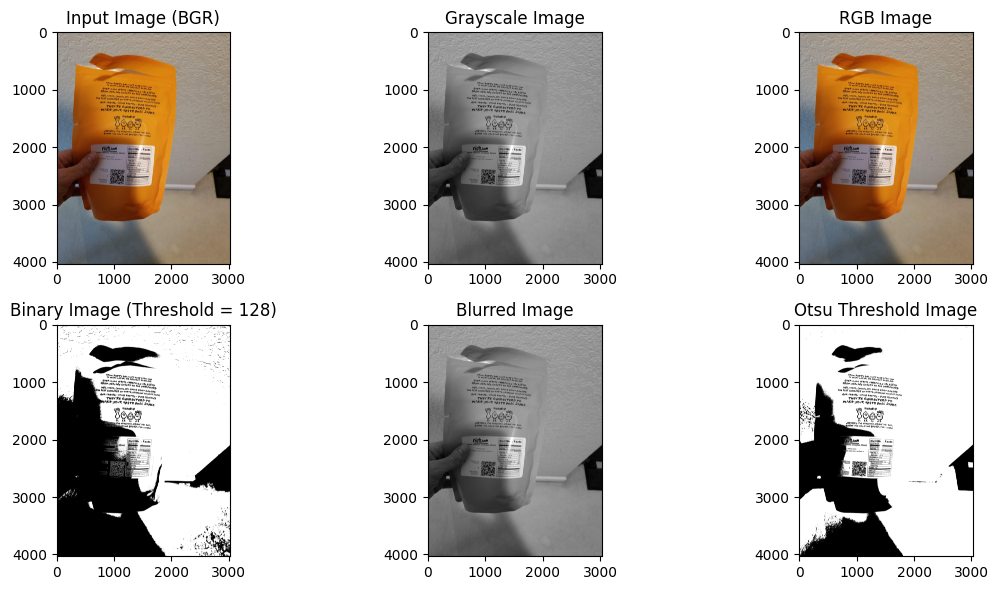

In [ ]:
# Example usage:
input_image = cv2.imread(array_sample)

grayscale_image = grayscale_conversion(input_image)
rgb_image = rgb_conversion(input_image)
binary_image = binarization2(grayscale_image)
blurred_image = gaussian_blur2(grayscale_image)
otsu_image = otsu_threshold2(grayscale_image)

# Displaying the images
plt.figure(figsize=(12, 6))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
plt.title('Input Image (BGR)')

plt.subplot(2, 3, 2)
plt.imshow(grayscale_image, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(2, 3, 3)
plt.imshow(rgb_image)
plt.title('RGB Image')

plt.subplot(2, 3, 4)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image (Threshold = 128)')

plt.subplot(2, 3, 5)
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image')

plt.subplot(2, 3, 6)
plt.imshow(otsu_image, cmap='gray')
plt.title('Otsu Threshold Image')

plt.tight_layout()
plt.show()

In [ ]:
decoded_objects = decode(binary_image)
print(decoded_objects)
# Display the decoded information
for obj in decoded_objects:
    print('Type:', obj.type)
    print('Data:', obj.data.decode('utf-8'))

[]


gray scale, Rgb,blur tasiri nadashtan be tanhaee vali Binary and otsu dasht


In [ ]:
processed_images = []

# Loop through each image path
for image_path in suc_addresses:
    # Read the image
    image = cv2.imread(image_path)

    # Apply image processing functions
    gray_image = grayscale_conversion(image)
    rgb_image = rgb_conversion(image)
    binary_image = binarization(gray_image)
    blurred_image = gaussian_blur(gray_image)
    otsu_image = otsu_threshold(gray_image)

    # Store the processed images
    processed_images.append({
        "image_path": image_path,
        "gray_image": gray_image,
        "rgb_image": rgb_image,
        "binary_image": binary_image,
        "blurred_image": blurred_image,
        "otsu_image": otsu_image
    })

In [ ]:
num_samples = min(3, len(processed_images))  # Show a maximum of 3 samples
for i in range(num_samples):
    sample_image = processed_images[i]

    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(2, 3, 1)
    plt.imshow(cv2.cvtColor(cv2.imread(sample_image["image_path"]), cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    # Grayscale image
    plt.subplot(2, 3, 2)
    plt.imshow(sample_image["gray_image"], cmap='gray')
    plt.title('Grayscale Image')

    # RGB image
    plt.subplot(2, 3, 3)
    plt.imshow(sample_image["rgb_image"])
    plt.title('RGB Image')

    # Binary image
    plt.subplot(2, 3, 4)
    plt.imshow(sample_image["binary_image"], cmap='gray')
    plt.title('Binary Image')

    # Blurred image
    plt.subplot(2, 3, 5)
    plt.imshow(sample_image["blurred_image"], cmap='gray')
    plt.title('Blurred Image')

    # Otsu threshold image
    plt.subplot(2, 3, 6)
    plt.imshow(sample_image["otsu_image"], cmap='gray')
    plt.title('Otsu Threshold Image')

    plt.tight_layout()
    plt.show()

In [ ]:
fail_Binary =0
fail_gray=0
fail_rgb=0
fail_blurred=0
fail_otsu=0
num_samples = len(processed_images)
for i in range(num_samples):
    sample_image = processed_images[i]
    decoded_objects = decode(sample_image["binary_image"])
    if len(decoded_objects) == 0:
       fail_Binary=fail_Binary+1
    else:
        print("suc")
    decoded_objects = decode(sample_image["gray_image"])
    if len(decoded_objects) == 0:
       fail_gray=fail_gray+1
    else:
        print("suc")
    decoded_objects = decode(sample_image["rgb_image"])
    if len(decoded_objects) == 0:
       fail_rgb=fail_rgb+1
    else:
        print("suc")
    decoded_objects = decode(sample_image["blurred_image"])
    if len(decoded_objects) == 0:
       fail_blurred=fail_blurred+1
    else:
        print("suc")
    decoded_objects = decode(sample_image["otsu_image"])
    if len(decoded_objects) == 0:
       fail_otsu=fail_otsu+1
    else:
        print("suc")

suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc


In [ ]:
num_samples

234

In [ ]:
print(fail_Binary)
print(fail_gray)
print(fail_blurred)
print(fail_rgb)
print(fail_otsu)

66
10
26
24
46


In [ ]:
def preprocess(address):
    processed_images = []

    # Loop through each key-value pair in the address dictionary
    for folder_name, image_paths in address.items():
        # Loop through each image path in the current folder
        for image_path in image_paths:
            # Read the image
            image = cv2.imread(image_path)

            # Apply image processing functions
            gray_image = grayscale_conversion(image)
            rgb_image = rgb_conversion(image)
            binary_image = binarization(gray_image)
            blurred_image = gaussian_blur(gray_image)
            otsu_image = otsu_threshold(gray_image)

            # Store the processed images with foldername key
            processed_images.append({
                "foldername": folder_name,
                "gray_image": gray_image,
                "rgb_image": rgb_image,
                "binary_image": binary_image,
                "blurred_image": blurred_image,
                "otsu_image": otsu_image
            })
    return processed_images

In [ ]:
ot_bl_result = []
for folder_name, image_paths in fail_addresses.items():
        # Loop through each image path in the current folder
        for image_path in image_paths:
            # Read the image
            image = cv2.imread(image_path)
            otsu_image = otsu_blurred(image)
            # Store the processed images with foldername key
            ot_bl_result.append(otsu_image)

In [ ]:
processed_images=preprocess(fail_addresses)

In [ ]:
processed_images = []

# Loop through each image path
for image_path in fail_addresses:
    # Read the image
    image = cv2.imread(image_path)

    # Apply image processing functions
    gray_image = grayscale_conversion(image)
    rgb_image = rgb_conversion(image)
    binary_image = binarization(gray_image)
    blurred_image = gaussian_blur(gray_image)
    otsu_image = otsu_threshold(gray_image)

    # Store the processed images
    processed_images.append({
        "image_path": image_path,
        "gray_image": gray_image,
        "rgb_image": rgb_image,
        "binary_image": binary_image,
        "blurred_image": blurred_image,
        "otsu_image": otsu_image
    })

error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
fail2_Binary =0
fail2_gray=0
fail2_rgb=0
fail2_blurred=0
fail2_otsu=0
num_samples = len(processed_images)
for i in range(num_samples):
    sample_image = processed_images[i]
    decoded_objects = decode(sample_image["binary_image"])
    if len(decoded_objects) == 0:
       fail2_Binary=fail2_Binary+1
    else:
        print("suc")
    decoded_objects = decode(sample_image["gray_image"])
    if len(decoded_objects) == 0:
       fail2_gray=fail2_gray+1
    else:
        print("suc")
    decoded_objects = decode(sample_image["rgb_image"])
    if len(decoded_objects) == 0:
       fail2_rgb=fail2_rgb+1
    else:
        print("suc")
    decoded_objects = decode(sample_image["blurred_image"])
    if len(decoded_objects) == 0:
       fail2_blurred=fail2_blurred+1
    else:
        print("suc")
    decoded_objects = decode(sample_image["otsu_image"])
    if len(decoded_objects) == 0:
       fail2_otsu=fail2_otsu+1
    else:
        print("suc")

suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc


In [ ]:
print(fail2_Binary)
print(fail2_gray)
print(fail2_blurred)
print(fail2_rgb)
print(fail2_otsu)

220
279
210
283
209


In [ ]:
result_Binary = (536-220)/536 * 100
result_Gray = (536-279)/536 * 100
result_Blured = (536-210)/536 * 100
result_RGB = (536-283)/536 * 100
result_otsu = (536-209)/536 * 100
print(result_Binary)
print(result_Gray)
print(result_Blured)
print(result_RGB)
print(result_otsu)


58.95522388059702
47.94776119402985
60.820895522388064
47.201492537313435
61.00746268656716


In [ ]:
del processed_images

In [ ]:
%reset -f


In [ ]:
len(processed_images)

0

In [ ]:
combined_fail=0
failObjects = []
num_samples = len(processed_images)
for i in range(num_samples):
    sample_image = processed_images[i]
    decoded_objects = decode(sample_image["binary_image"])
    if len(decoded_objects) == 0:
       decoded_objects = decode(sample_image["gray_image"])
       if len(decoded_objects) == 0:
          decoded_objects = decode(sample_image["rgb_image"])
          if len(decoded_objects) == 0:
            decoded_objects = decode(sample_image["blurred_image"])
            if len(decoded_objects) == 0:
              decoded_objects = decode(sample_image["otsu_image"])
              if len(decoded_objects) == 0:
                combined_fail=combined_fail+1
                failObjects.append(sample_image["foldername"])
              else:
                print("suc otsu_image")
            else:
                print("suc blurred_image")
          else:
              print("suc rgb_image")
       else:
            print("suc gray_image")
    else:
       print("suc binary_image")


suc gray_image
suc blurred_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc blurred_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc blurred_image
suc binary_image
suc otsu_image
suc blurred_image
suc binary_image
suc binary_image
suc binary_image
suc blurred_image
suc binary_image
suc otsu_image
suc binary_image
suc blurred_image
suc blurred_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_image
suc binary_im

In [ ]:
combined_fail

167

In [ ]:
result = (count-combined_fail)/count * 100

In [ ]:
result

68.84328358208955

Combined result is 68.84

In [ ]:
from collections import Counter
fail_objects_counts = Counter(failObjects)

In [ ]:
fail_objects_counts

Counter({'shadows': 1,
         'close': 13,
         'blurred': 15,
         'curved': 22,
         'pathological': 7,
         'high_version': 22,
         'monitor': 4,
         'nominal': 7,
         'glare': 19,
         'perspective': 13,
         'damaged': 22,
         'bright_spots': 18,
         'brightness': 4})

In [ ]:
folder_fail_count_occurrences = {}

# Iterate through each key-value pair in fail_addresses
for folder_name in processed_images:
    # Calculate the count of items in the list (number of image paths)
    count = len(image_paths)
    # Store the count for the current key (folder name)
    folder_fail_count_occurrences[folder_name] = count
# Print the count of items for each key
for folder_name, count in folder_fail_count_occurrences.items():
    print(f"Folder '{folder_name}' has {count} occurrences of failed detections.")

In [ ]:

fail2_otsu_blurred=0
num_samples = len(ot_bl_result)
for i in range(num_samples):
    sample_image = ot_bl_result[i]
    decoded_objects = decode(sample_image)
    if len(decoded_objects) == 0:
       fail2_otsu_blurred=fail2_otsu_blurred+1
    else:
        print("suc")

suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc
suc


In [ ]:
fail2_otsu_blurred

210